# Load libraries

In [2]:
import numpy as np  # numerical computation with arrays
import pandas as pd # library to manipulate datasets using dataframes
import scipy as sp  # statistical library

import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [3]:
# Load sklearn libraries for machine learning
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score 
from sklearn.metrics import confusion_matrix
from sklearn.metrics import plot_confusion_matrix
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve

In [13]:
# Install & import pandas_profiling
#!pip install pandas_profiling

import pandas_profiling

In [5]:
# Install & import SMOTE for building a balanced train and test data set
!pip install imblearn

from imblearn.over_sampling import SMOTE

# Reading & processing data

In [6]:
df = pd.read_csv("TrainingWiDS2021.csv", index_col=0)

df = df.set_index('encounter_id')

In [7]:
df.head()

,hospital_id,age,bmi,elective_surgery,ethnicity,gender,height,hospital_admit_source,icu_admit_source,icu_id,...,h1_pao2fio2ratio_max,h1_pao2fio2ratio_min,aids,cirrhosis,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis,diabetes_mellitus
encounter_id,,,,,,,,,,,,,,,,,,,,,
214826,118,68.0,22.732803,0,Caucasian,M,180.3,Floor,Floor,92,...,NaN,NaN,0,0,0,0,0,0,0,1
246060,81,77.0,27.421875,0,Caucasian,F,160.0,Floor,Floor,90,...,51.0,51.0,0,0,0,0,0,0,0,1
276985,118,25.0,31.952749,0,Caucasian,F,172.7,Emergency Department,Accident & Emergency,93,...,NaN,NaN,0,0,0,0,0,0,0,0
262220,118,81.0,22.635548,1,Caucasian,F,165.1,Operating Room,Operating Room / Recovery,92,...,337.0,337.0,0,0,0,0,0,0,0,0
201746,33,19.0,NaN,0,Caucasian,M,188.0,NaN,Accident & Emergency,91,...,NaN,NaN,0,0,0,0,0,0,0,0


In [8]:
df.shape
df.describe()

,hospital_id,age,bmi,elective_surgery,height,icu_id,pre_icu_los_days,readmission_status,weight,albumin_apache,...,h1_pao2fio2ratio_max,h1_pao2fio2ratio_min,aids,cirrhosis,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis,diabetes_mellitus
count,130157.000000,125169.000000,125667.000000,130157.000000,128080.000000,130157.000000,130157.000000,130157.0,126694.000000,51994.000000,...,16760.000000,16760.000000,130157.00000,130157.000000,130157.000000,130157.000000,130157.000000,130157.000000,130157.000000,130157.000000
mean,106.102131,61.995103,29.110260,0.189840,169.607219,662.428344,0.839933,0.0,83.791104,2.886149,...,247.525419,239.617358,0.00103,0.016081,0.013599,0.025669,0.007307,0.004187,0.020852,0.216285
std,63.482277,16.822880,8.262776,0.392176,10.833085,304.259843,2.485337,0.0,24.963063,0.689812,...,131.440167,128.562211,0.03207,0.125786,0.115819,0.158146,0.085166,0.064574,0.142888,0.411712
min,1.000000,0.000000,14.844926,0.000000,137.200000,82.000000,-0.250000,0.0,38.600000,1.200000,...,42.000000,38.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,49.000000,52.000000,23.598006,0.000000,162.500000,427.000000,0.045833,0.0,66.500000,2.400000,...,144.000000,138.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,112.000000,64.000000,27.564749,0.000000,170.100000,653.000000,0.155556,0.0,80.000000,2.900000,...,228.125000,218.750000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,165.000000,75.000000,32.803127,0.000000,177.800000,969.000000,0.423611,0.0,96.800000,3.400000,...,333.000000,324.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,204.000000,89.000000,67.814990,1.000000,195.590000,1111.000000,175.627778,0.0,186.000000,4.600000,...,720.000000,654.813793,1.00000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [9]:
df.info(verbose=True, show_counts=True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 130157 entries, 214826 to 157942
Data columns (total 179 columns):
 #    Column                       Non-Null Count   Dtype  
---   ------                       --------------   -----  
 0    hospital_id                  130157 non-null  int64  
 1    age                          125169 non-null  float64
 2    bmi                          125667 non-null  float64
 3    elective_surgery             130157 non-null  int64  
 4    ethnicity                    128570 non-null  object 
 5    gender                       130091 non-null  object 
 6    height                       128080 non-null  float64
 7    hospital_admit_source        96959 non-null   object 
 8    icu_admit_source             129917 non-null  object 
 9    icu_id                       130157 non-null  int64  
 10   icu_stay_type                130157 non-null  object 
 11   icu_type                     130157 non-null  object 
 12   pre_icu_los_days             130157 n

In [12]:
trainprofile = pandas_profiling.ProfileReport(df,'EDA')
trainprofile

Summarize dataset:   0%|          | 0/188 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

<AxesSubplot:xlabel='diabetes_mellitus', ylabel='count'>

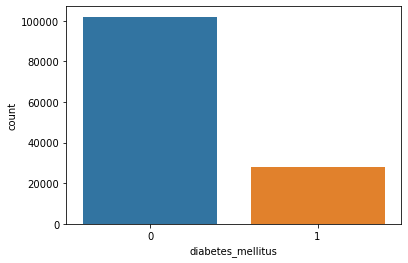

In [14]:
sns.countplot(x="diabetes_mellitus", data=df)

### Population of patients with diabetes is very smaller than nondiabetic patients. For ML models, it is necessary to balance them in train test data set. 

In [15]:
p = len(df[df['diabetes_mellitus'] == 1.0])
p / len(df['diabetes_mellitus'])

0.21628494817796967

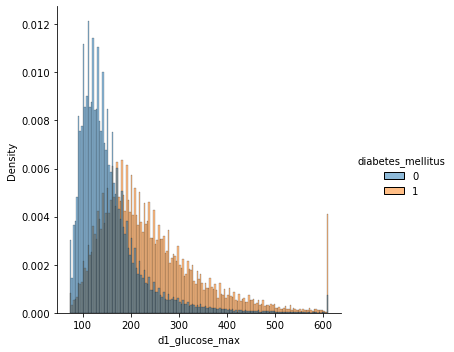

In [16]:
#plotting distribution
sns.displot(x="d1_glucose_max", data=df, hue = "diabetes_mellitus", stat="density", common_norm=False)

## Exploring predictors

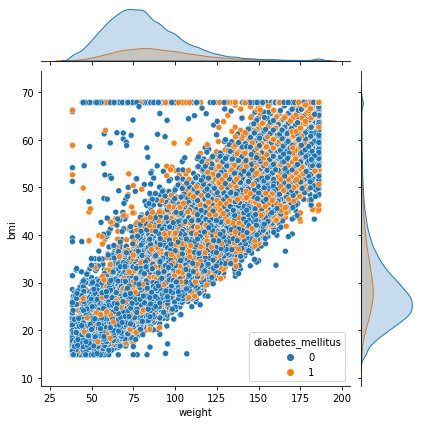

In [17]:
sns.jointplot(data=df, x="weight", y="bmi", hue="diabetes_mellitus")

### bmi is not a perfect predictor for diabetes mellitus. 

In [18]:
# Exploring correlations between numerical features

# Selecting numerical features & their correlations 
num_features = df.select_dtypes(include=['float64']).columns.values
df_corr = df[num_features].corr()

<AxesSubplot:>

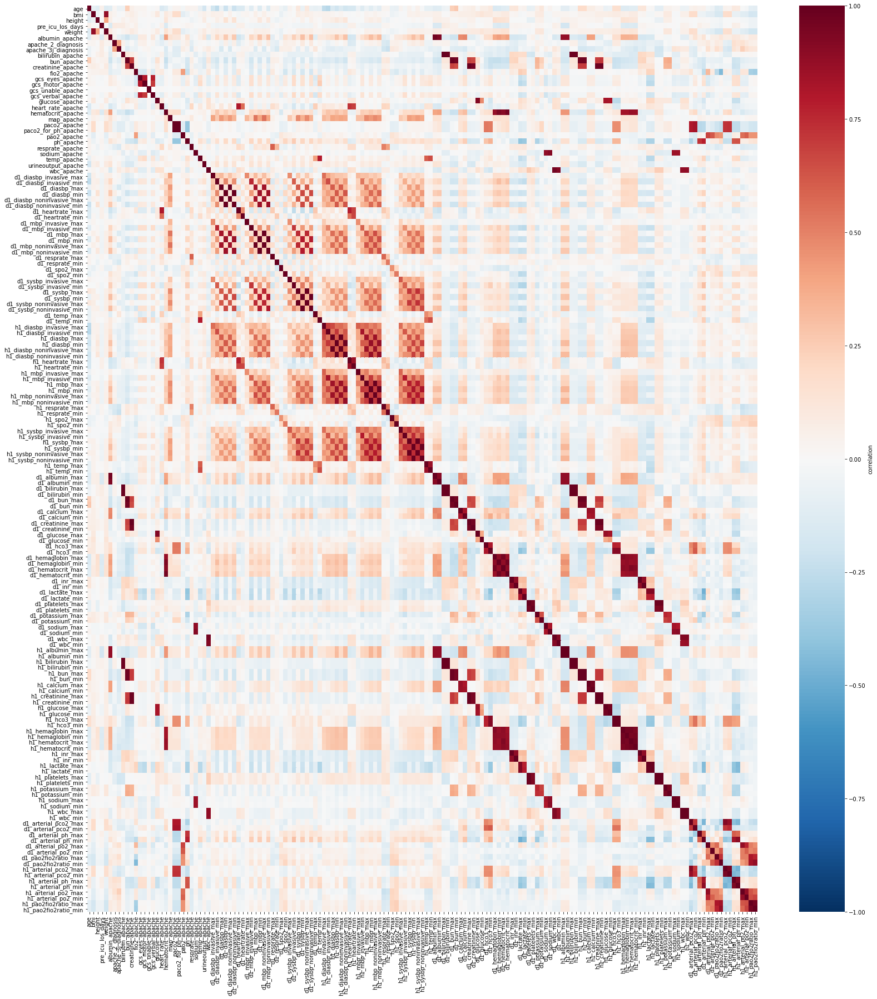

In [19]:
# Plot heatmap of correlations
fig, ax = plt.subplots(figsize=(27, 30))
sns.heatmap(df_corr, vmin=-1, vmax=1, cmap = 'RdBu_r', xticklabels=True, yticklabels=True, cbar_kws={'label' : 'correlation'}, ax=ax)

In [20]:
# Create any new features 
df['d1_glucose_diff'] = df['d1_glucose_max'] - df['d1_glucose_min']

# Any new feature? 

In [21]:
# Drop unimportant covariates.
df = df.drop(['hospital_id', 'icu_id', 'bmi'], axis=1)

# Any other covariates? 

## Preparing covariates

In [22]:
# Converting categorical variable into indicator (dummy) variables.
df = pd.get_dummies(df)

In [23]:
# Scaling the values to transform the data into (0, 1) domain. 

scalar = MinMaxScaler()

values = df.values
scalar.fit(values)

values_scaled = scalar.transform(values)
df = pd.DataFrame(values_scaled, columns=df.columns, index=df.index)

In [24]:
df.head(10)

,age,elective_surgery,height,pre_icu_los_days,readmission_status,weight,albumin_apache,apache_2_diagnosis,apache_3j_diagnosis,apache_post_operative,...,icu_stay_type_readmit,icu_stay_type_transfer,icu_type_CCU-CTICU,icu_type_CSICU,icu_type_CTICU,icu_type_Cardiac ICU,icu_type_MICU,icu_type_Med-Surg ICU,icu_type_Neuro ICU,icu_type_SICU
encounter_id,,,,,,,,,,,,,,,,,,,,,
214826,0.764045,0.0,0.738140,0.004501,0.0,0.239484,0.323529,0.057971,0.228074,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
246060,0.865169,0.0,0.390478,0.006697,0.0,0.214383,NaN,0.033816,0.092229,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
276985,0.280899,0.0,0.607981,0.001425,0.0,0.384668,NaN,0.101449,0.319404,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
262220,0.910112,1.0,0.477822,0.001425,0.0,0.156716,NaN,0.492754,0.547932,1.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
201746,0.213483,0.0,0.870012,0.001840,0.0,NaN,NaN,0.086957,0.273053,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
182697,0.752809,0.0,0.912828,0.001425,0.0,0.416554,NaN,0.966184,0.183095,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
195124,0.662921,0.0,0.477822,0.001425,0.0,0.800543,NaN,0.033816,0.092229,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
179261,0.786517,0.0,0.476109,0.001433,0.0,NaN,NaN,0.057971,0.227638,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
271041,0.505618,0.0,0.565165,0.001473,0.0,NaN,0.441176,0.072464,0.046796,0.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [25]:
# Keeping df as original dataframe before imputation
df0 = df

## Simple Imputer

In [26]:
# Define a simple imputer, I used median. Note that this simple imputer may change the data distribution of features. 

imputer = SimpleImputer(strategy = "median")

# Impute the missing data
df = pd.DataFrame(imputer.fit_transform(df), columns=df.columns, index=df.index)

# Train & Test data sets

In [27]:
# First we split the dataframe df to x and y. The x includes everything except 'diabetes_mellitus' data. 
# The y includes only 'diabetes_mellitus'. 

X = df.loc[:, df.columns != 'diabetes_mellitus'] # OR X = df.drop('diabetes_mellitus', axis=1)
y = df.loc[:, df.columns == 'diabetes_mellitus']

In [28]:
# Using SMOTE to balance diabetic patients in train data set. 

os = SMOTE(random_state=0)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=0)

columns = X_train.columns
os_data_X, os_data_y = os.fit_resample(X_train, y_train)
os_data_X = pd.DataFrame(data = os_data_X, columns = columns)
os_data_y= pd.DataFrame(data = os_data_y, columns = ['diabetes_mellitus'])


In [29]:
# we can Check the numbers of our data
print("length of oversampled data is ", len(os_data_X))
print("Number of no diabetes", len(os_data_y[os_data_y['diabetes_mellitus'] == 0.0]))
print("Number of diabetes", len(os_data_y[os_data_y['diabetes_mellitus'] == 1.0]))
print("Proportion of no diabetes in oversampled data is ", len(os_data_y[os_data_y['diabetes_mellitus'] == 0.0])/len(os_data_X))
print("Proportion of diabetes in oversampled data is ", len(os_data_y[os_data_y['diabetes_mellitus'] == 1.0])/len(os_data_X))

length of oversampled data is  142836
Number of no diabetes 71418
Number of diabetes 71418
Proportion of no diabetes in oversampled data is  0.5
Proportion of diabetes in oversampled data is  0.5


In [30]:
X_train = os_data_X
y_train = os_data_y

# ML model - Logistic Regression

### Building ML model by train data set

In [31]:
# importing and applying logistic regression model 

model = LogisticRegression()
result = model.fit(X_train, y_train)

y_pred = model.predict(X_test)

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\validation.py:63: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  return f(*args, **kwargs)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:765: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


In [32]:
# Measuring score of logistic regression. 

score = accuracy_score(y_test,y_pred)
print('Accuracy of logistic regression classifier on test set:' , score)

Accuracy of logistic regression classifier on test set: 0.771819299323909


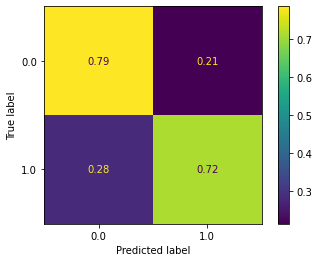

In [33]:
# Knowing the false positive and false negative is crucial in this model. A confusion matrix can present these numbers.  

plot_confusion_matrix(model, X_test, y_test, normalize='true')  
plt.show() 

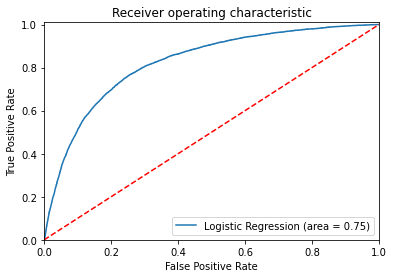

In [34]:
# Plotting ROC Curve! A closer ROC curve to the top left corner presents a better model!   

logit_roc_auc = roc_auc_score(y_test, model.predict(X_test))
fpr, tpr, thresholds = roc_curve(y_test, model.predict_proba(X_test)[:,1])

plt.figure()
plt.plot(fpr, tpr, label='Logistic Regression (area = %0.2f)' % logit_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.01])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.savefig('Log_ROC')
plt.show()

### Test ML model by test data set

In [47]:
# Reading test data 

df_test = pd.read_csv("UnlabeledWiDS2021.csv", index_col=0)
df_test = df_test.set_index('encounter_id')

In [48]:
df_test.head()

,hospital_id,age,bmi,elective_surgery,ethnicity,gender,height,hospital_admit_source,icu_admit_source,icu_id,...,h1_arterial_po2_min,h1_pao2fio2ratio_max,h1_pao2fio2ratio_min,aids,cirrhosis,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis
encounter_id,,,,,,,,,,,,,,,,,,,,,
144740,10141,72,NaN,0,Caucasian,F,152.4,Floor,Accident & Emergency,82,...,NaN,NaN,NaN,0,0,0,0,0,0,0
141990,10141,86,NaN,0,Caucasian,F,175.3,Emergency Department,Accident & Emergency,82,...,NaN,NaN,NaN,0,0,0,0,0,0,0
142038,10141,72,NaN,0,Caucasian,F,162.6,Floor,Floor,82,...,NaN,NaN,NaN,0,0,0,0,0,0,0
138628,10141,66,NaN,0,Caucasian,M,177.8,Floor,Floor,82,...,NaN,NaN,NaN,0,0,0,0,0,0,0
141682,10141,89,NaN,0,Caucasian,M,170.2,Direct Admit,Accident & Emergency,82,...,NaN,NaN,NaN,0,0,0,0,0,0,0


In [49]:
# set & modifying test data set. The same modifications of train data set should be implemented for test data set as well. 

df_test['d1_glucose_diff'] = df_test['d1_glucose_max'] - df_test['d1_glucose_min']

df_test = df_test.drop(['hospital_id', 'icu_id', 'bmi'], axis=1)

df_test = pd.get_dummies(df_test)

scalar = MinMaxScaler()
values = df_test.values
scalar.fit(values)
values_scaled = scalar.transform(values)
df_test = pd.DataFrame(values_scaled, columns=df_test.columns, index=df_test.index)

### The following columns exist in train data set because I use dummy function (i.e., df = pd.get_dummies(df)). Test data set does not include the following columns and they should be added. Change test data and add columns for: 
hospital_admit_source_ICU , 
hospital_admit_source_Observation , 
hospital_admit_source_Other , 
hospital_admit_source_PACU, 
hospital_admit_source_Step-Down Unit (SDU)

In [50]:
df_test['hospital_admit_source_ICU'] = np.zeros(10234)
df_test['hospital_admit_source_Observation'] = np.zeros(10234)
df_test['hospital_admit_source_Other'] = np.zeros(10234)
df_test['hospital_admit_source_PACU'] = np.zeros(10234)
df_test['hospital_admit_source_Acute Care/Floor'] = np.zeros(10234)

In [51]:
df_test.shape

(10234, 209)

In [52]:
imputer = SimpleImputer(strategy = "median")

df_test = pd.DataFrame(imputer.fit_transform(df_test), columns=df_test.columns, index=df_test.index)

In [53]:
diabesic_results = model.predict(df_test)
df_test['diabetes_mellitus'] = diabesic_results

In [54]:
df_test.shape

(10234, 210)

In [55]:
df_test = df_test.reset_index()

In [56]:
df_test.head()

,encounter_id,age,elective_surgery,height,pre_icu_los_days,readmission_status,weight,albumin_apache,apache_2_diagnosis,apache_3j_diagnosis,...,icu_type_MICU,icu_type_Med-Surg ICU,icu_type_Neuro ICU,icu_type_SICU,hospital_admit_source_ICU,hospital_admit_source_Observation,hospital_admit_source_Other,hospital_admit_source_PACU,hospital_admit_source_Acute Care/Floor,diabetes_mellitus
0,144740,0.692308,0.0,0.262799,0.003380,0.0,0.279503,0.500000,0.043478,0.047211,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,141990,0.871795,0.0,0.653584,0.003149,0.0,0.279503,0.529412,0.077295,0.048120,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,142038,0.692308,0.0,0.436860,0.003202,0.0,0.279503,0.617647,0.971014,0.049483,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,138628,0.615385,0.0,0.696246,0.016512,0.0,0.279503,0.529412,0.057971,0.227606,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,141682,0.910256,0.0,0.566553,0.003349,0.0,0.279503,0.676471,0.077295,0.048120,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


<AxesSubplot:xlabel='diabetes_mellitus', ylabel='count'>

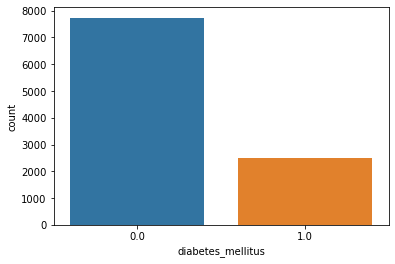

In [57]:
sns.countplot(x="diabetes_mellitus", data=df_test)

In [58]:
submission_results = df_test[['encounter_id', 'diabetes_mellitus']]
submission_results = submission_results.set_index('encounter_id')

In [59]:
submission_results.head()

,diabetes_mellitus
encounter_id,
144740,0.0
141990,0.0
142038,0.0
138628,0.0
141682,0.0


### Creating a submission file.

In [62]:
 submission_results.to_csv('submission_01.csv')

In [ ]:
# Accuracy of model can be improved by feature reduction or defining more representative features.  

In [61]:
# END